# Red List assessment

### 1. What are the most assessed classes?
### 2. What is the assessment results of the most assessed classes?
### 3. What are the least assessed classes?
### 4. What is the distrubution of total amout of assessed species among the classes in the Red List?
### 5. Which classes have the greatest amount of extinct and threatened species?
### 6. Is there a correlation between amount of extinct and threatened species in a class and the amount of assessed species?
### 7.
### 8.
### 9. 
### 10. Which classes has the greatest percentage of threatened species?



In [125]:
# Import packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
%matplotlib inline

In [2]:
# Read data
df = pd.read_csv('species_redlist_data.csv', index_col = 0)
#df.set_index("Name", inplace = True)

In [3]:
df

,EX,EW,Subtotal (EX+EW),CR(PE),CR(PEW),Subtotal (EX+EW+ CR(PE)+CR(PEW)),CR,EN,VU,Subtotal (threatened spp.),LR/cd,NT or LR/nt,LC or LR/lc,DD,Total
Name,,,,,,,,,,,,,,,
ACTINOPTERYGII,81,11,92,128,8,228,697,"1,089","1,348","3,134",0,714,"15,269","4,786","23,995"
AMPHIBIA,36,2,38,156,1,195,722,"1,144",740,"2,606",0,406,"3,291","1,145","7,486"
ANTHOZOA,0,0,0,2,0,2,26,27,203,256,0,180,280,135,851
ARACHNIDA,9,0,9,21,0,30,73,107,71,251,0,23,94,64,441
ASTEROIDEA,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
POLYTRICHOPSIDA,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
SPHAGNOPSIDA,0,0,0,0,0,0,6,3,4,13,0,0,3,1,17
TAKAKIOPSIDA,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1


In [4]:
# Check for missing values
df.isnull().sum() 

EX                                  0
EW                                  0
Subtotal (EX+EW)                    0
CR(PE)                              0
CR(PEW)                             0
Subtotal (EX+EW+ CR(PE)+CR(PEW))    0
CR                                  0
EN                                  0
VU                                  0
Subtotal (threatened spp.)          0
LR/cd                               0
NT or LR/nt                         0
LC or LR/lc                         0
DD                                  0
Total                               0
dtype: int64

In [5]:
df = df.replace({',':''}, regex=True) #remove commas in dataset
df.drop(df.tail(1).index,inplace=True) # drop last n row
df = df.drop('NOT ASSIGNED')
df = df.astype(float)
df

,EX,EW,Subtotal (EX+EW),CR(PE),CR(PEW),Subtotal (EX+EW+ CR(PE)+CR(PEW)),CR,EN,VU,Subtotal (threatened spp.),LR/cd,NT or LR/nt,LC or LR/lc,DD,Total
Name,,,,,,,,,,,,,,,
ACTINOPTERYGII,81.0,11.0,92.0,128.0,8.0,228.0,697.0,1089.0,1348.0,3134.0,0.0,714.0,15269.0,4786.0,23995.0
AMPHIBIA,36.0,2.0,38.0,156.0,1.0,195.0,722.0,1144.0,740.0,2606.0,0.0,406.0,3291.0,1145.0,7486.0
ANTHOZOA,0.0,0.0,0.0,2.0,0.0,2.0,26.0,27.0,203.0,256.0,0.0,180.0,280.0,135.0,851.0
ARACHNIDA,9.0,0.0,9.0,21.0,0.0,30.0,73.0,107.0,71.0,251.0,0.0,23.0,94.0,64.0,441.0
ASTEROIDEA,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
POLYPODIOPSIDA,2.0,1.0,3.0,8.0,0.0,11.0,68.0,89.0,89.0,246.0,0.0,38.0,273.0,82.0,642.0
POLYTRICHOPSIDA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
SPHAGNOPSIDA,0.0,0.0,0.0,0.0,0.0,0.0,6.0,3.0,4.0,13.0,0.0,0.0,3.0,1.0,17.0


### 1. What are the most assessed classes?

In [6]:
total_listings = df[['Total']].astype(float) #change dtype to float to correct sorting
Most_assessed = total_listings.sort_values(by=['Total'], ascending = False) #sort numbers
Most_assessed

,Total
Name,
MAGNOLIOPSIDA,51471.0
ACTINOPTERYGII,23995.0
INSECTA,12441.0
AVES,11188.0
REPTILIA,10222.0
...,...
EXOBASIDIOMYCETES,1.0
MONOPLACOPHORA,1.0
ECHINOIDEA,1.0


In [7]:
listings = Most_assessed.iloc[0:10] #top 10
listings

,Total
Name,
MAGNOLIOPSIDA,51471.0
ACTINOPTERYGII,23995.0
INSECTA,12441.0
AVES,11188.0
REPTILIA,10222.0
LILIOPSIDA,8999.0
AMPHIBIA,7486.0
GASTROPODA,7458.0
MAMMALIA,5973.0


In [62]:
# Renaming index for table
common_name = {'MAGNOLIOPSIDA':'Magnolia Plants', 'ACTINOPTERYGII':'Ray-Finned Fish', 'INSECTA':'Insects', 'AVES':'Birds', 'REPTILIA':'Reptiles', 'LILIOPSIDA':'Monocot Plants', 'AMPHIBIA':'Amphibians', 'GASTROPODA':'Snails and Slugs', 'MAMMALIA':'Mammals', 'MALACOSTRACA':'Soft Shells'}
listings = listings.rename(index=common_name)

In [63]:
listings['Kingdom'] = ['Plant', 'Animal', 'Animal', 'Animal', 'Animal', 'Plant', 'Animal', 'Animal','Animal', 'Animal']
listings

,Total,Organism,Kingdom
Name,,,
Magnolia Plants,51471.0,Magnolia Plants,Plant
Ray-Finned Fish,23995.0,Ray-Finned Fish,Animal
Insects,12441.0,Insects,Animal
Birds,11188.0,Birds,Animal
Reptiles,10222.0,Reptiles,Animal
Monocot Plants,8999.0,Monocot Plants,Plant
Amphibians,7486.0,Amphibians,Animal
Snails and Slugs,7458.0,Snails and Slogs,Animal
Mammals,5973.0,Mammals,Animal


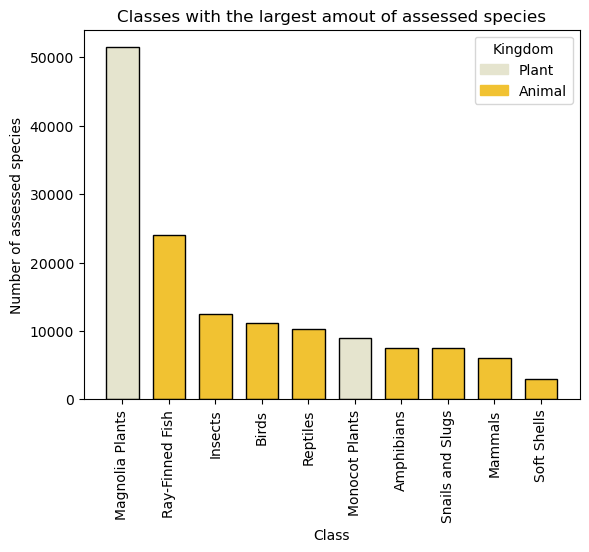

In [211]:
col = []
for val in listings['Kingdom']:
    if val == 'Plant':
        col.append('#e5e4ce')
    else:
        col.append('#f1c232')

#col_map = plt.get_cmap('viridis') #set colour map
plt.bar(listings.index, listings['Total'], width=0.7, color=col, edgecolor = 'black') #create a simple bar chart

plt.title('Classes with the largest amout of assessed species', size = 12) #add title and labels
# rotate x-axis labels
plt.ylabel("Number of assessed species")
plt.xlabel("Class")
plt.xticks(rotation=90)


# Create custom legend
green_patch = mpatches.Patch(color='#e5e4ce', label='Plant')
orange_patch = mpatches.Patch(color='#f1c232', label='Animal')
plt.legend(handles=[green_patch, orange_patch], title='Kingdom')

plt.show()

In [104]:
<div>
<img src="attachment:image-2.png" width="500"/>
</div>

SyntaxError: invalid syntax (1552141223.py, line 1)

In [101]:

<div>
<img src="" width="500"/>
</div>

Magnolia tree

SyntaxError: invalid syntax (3619178080.py, line 1)

### 2.  What is the assessment staus of the most assessed classes?

In [53]:
df['Conservation_dependent/Least_Risk/Least_Consern'] = df['Total'] -(df['Subtotal (EX+EW+ CR(PE)+CR(PEW))'] + df['Subtotal (threatened spp.)'] + df['DD'])

In [54]:
EX_TH_LC_TOT = df[['Subtotal (EX+EW+ CR(PE)+CR(PEW))', 'Subtotal (threatened spp.)', 'Conservation_depended/Least_Risk/Least_Consern', 'Total', 'DD']]

In [217]:
# Renaming index for table
EX_TH_LC_TOT = EX_TH_LC_TOT.rename(index=common_name)

In [250]:
EX_TH_LC_TOT = EX_TH_LC_TOT.sort_values(by = 'Total', ascending = False ).head(10)
EX_TH_LC = EX_TH_LC_TOT.drop(columns=['Total'])
EX_TH_LC = EX_TH_LC.rename(columns={'DD': 'Data_Deficient', 'Subtotal (threatened spp.)': 'Threatened', 'Subtotal (EX+EW+ CR(PE)+CR(PEW))':'Extinct (EX+EW)'})
EX_TH_LC

,Extinct (EX+EW),Threatened,Conservation_depended/Least_Risk/Least_Consern,Data_Deficient
Name,,,,
Magnolia Plants,621.0,20551.0,26462.0,3837.0
Ray-Finned Fish,228.0,3134.0,15847.0,4786.0
Insects,153.0,2345.0,6726.0,3217.0
Birds,186.0,1400.0,9556.0,46.0
Reptiles,82.0,1842.0,6811.0,1487.0
Monocot Plants,118.0,3449.0,4420.0,1012.0
Amphibians,195.0,2606.0,3540.0,1145.0
Snails and Slugs,420.0,2178.0,3213.0,1647.0
Mammals,116.0,1340.0,3678.0,839.0


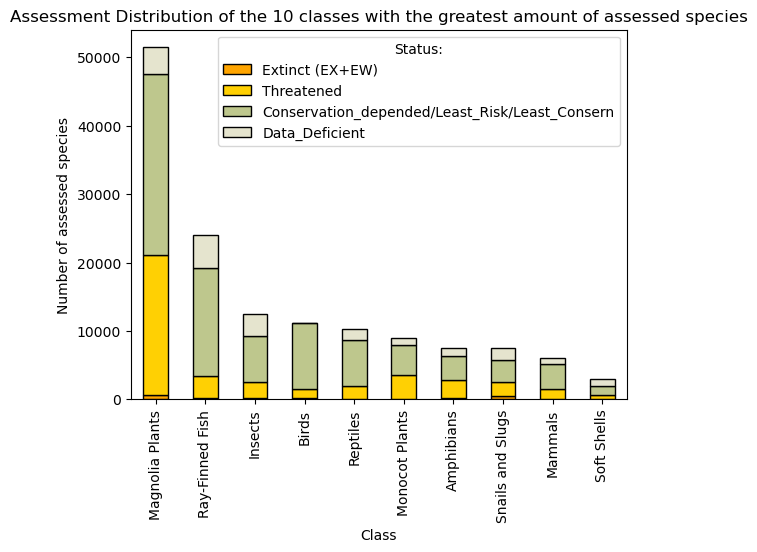

In [253]:

# Plot stacked bar chart

color_map = {
    'Data_Deficient': '#e5e4ce',
    'Threatened': '#ffd003',
    'Extinct (EX+EW)': 'orange',
    'Conservation_depended/Least_Risk/Least_Consern':'#bec78d'
}

colors = [color_map[col] if col in color_map else '#1111' for col in EX_TH_LC.columns]
EX_TH_LC.plot(kind='bar', stacked=True, color = colors, edgecolor = 'black')


# Add titles and labels
plt.title('Assessment Distribution of the 10 classes with the greatest amount of assessed species')
plt.xlabel('Class')  
plt.ylabel('Number of assessed species')
plt.legend(title='Status:')

plt.show()

## 3.  What are the least assessed classes?

In [11]:
# Find all classes with less than 20 assessed species
total_listings['Total'] 
under_20 = total_listings[total_listings['Total'] < 20]
under_20.sort_values(by = ['Name'])

,Total
Name,
ANDREAEOPSIDA,3.0
ANTHOCEROTOPSIDA,3.0
ARTHONIOMYCETES,3.0
ASTEROIDEA,1.0
CHAROPHYACEAE,14.0
CHILOPODA,11.0
CHLOROPHYCEAE,1.0
COLLEMBOLA,9.0
DOTHIDEOMYCETES,2.0


In [12]:
under_20.count() # How many classes have less than 20 species assessed?

Total    35
dtype: int64

<div>
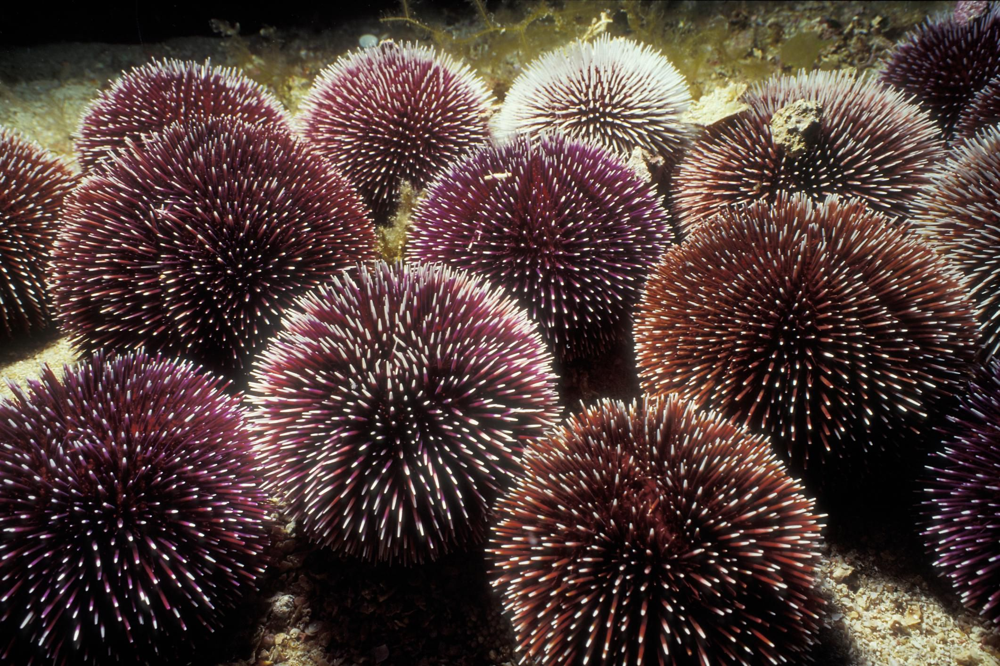
</div>

Echinoidea, or Sea urchin is one of the least assessed classes in the Red List, with one species included. 

## 4. What is the distrubution of total amout of assessed species among the classes?

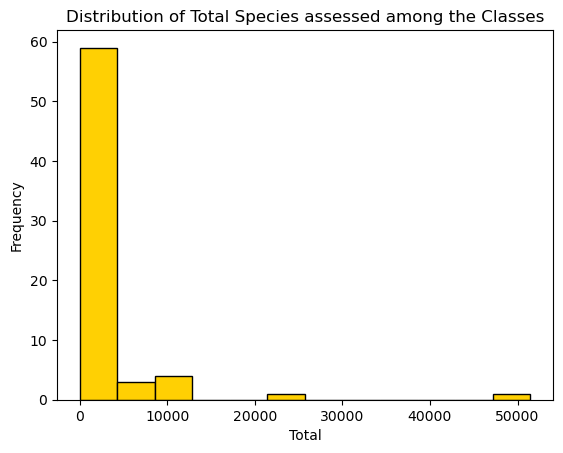

In [258]:
plt.hist(total_listings['Total'], bins=12, edgecolor='black', color = '#ffd003') 

# Adding titles and labels
plt.title('Distribution of Total Species assessed among the Classes')
plt.xlabel('Total')
plt.ylabel('Frequency')

# Show the plot
plt.show()

## 5.  Which classes have the most exinct species?

In [14]:
Exstinct= df[['Subtotal (EX+EW)']]
Exstinct_taxa = Exstinct.sort_values(by=['Subtotal (EX+EW)'],ascending=False)
EX1 = Exstinct_taxa.loc[(Exstinct_taxa!=0).any(axis=1)] #remove domains with 0 
EX1.index

Index(['GASTROPODA', 'AVES', 'MAGNOLIOPSIDA', 'ACTINOPTERYGII', 'MAMMALIA',
       'INSECTA', 'AMPHIBIA', 'REPTILIA', 'BIVALVIA', 'LILIOPSIDA',
       'ARACHNIDA', 'MALACOSTRACA', 'CYCADOPSIDA', 'BRYOPSIDA', 'DIPLOPODA',
       'POLYPODIOPSIDA', 'CLITELLATA', 'OSTRACODA', 'MAXILLOPODA',
       'FLORIDEOPHYCEAE', 'TURBELLARIA', 'HEXANAUPLIA', 'ENOPLA'],
      dtype='object', name='Name')

In [15]:
EX1 =EX1.iloc[0:10] #top 10 
EX1

,Subtotal (EX+EW)
Name,
GASTROPODA,281.0
AVES,164.0
MAGNOLIOPSIDA,135.0
ACTINOPTERYGII,92.0
MAMMALIA,87.0
INSECTA,60.0
AMPHIBIA,38.0
REPTILIA,34.0
BIVALVIA,32.0


In [16]:
EX1['Organisms'] = ['Snails and Slugs', 'Birds', 'Magnolia Plants', 'Ray-Finned Fish', 'Mammals', 'Insects','Amphibians', 'Reptils', 'Soft Shells', 'Monocot Plants']
EX1

,Subtotal (EX+EW),Organisms
Name,,
GASTROPODA,281.0,Snails and Slugs
AVES,164.0,Birds
MAGNOLIOPSIDA,135.0,Magnolia Plants
ACTINOPTERYGII,92.0,Ray-Finned Fish
MAMMALIA,87.0,Mammals
INSECTA,60.0,Insects
AMPHIBIA,38.0,Amphibians
REPTILIA,34.0,Reptils
BIVALVIA,32.0,Soft Shells


In [17]:
EX1['Kingdom'] = ['Animal', 'Animal', 'Plant', 'Animal', 'Animal', 'Animal', 'Animal', 'Animal','Animal', 'Plant']

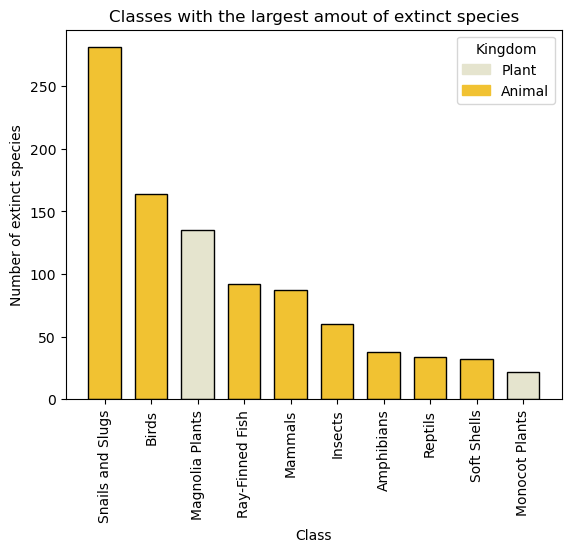

In [210]:
col = []
for val in EX1['Kingdom']:
    if val == 'Animal':
        col.append('#f1c232')
    else:
        col.append('#e5e4ce')

col_map = plt.get_cmap('inferno') #set colour map
plt.bar(EX1['Organisms'], EX1['Subtotal (EX+EW)'], width=0.7, color = col, edgecolor = 'black') #create a simple bar chart#color = col_map.colors

plt.title('Classes with the largest amout of extinct species', size = 12) #add title and labels
plt.ylabel("Number of extinct species")
plt.xlabel("Class")
plt.xticks(rotation=90)

# Create custom legend
green_patch = mpatches.Patch(color='#e5e4ce', label='Plant')
orange_patch = mpatches.Patch(color='#f1c232', label='Animal')
plt.legend(handles=[green_patch, orange_patch], title='Kingdom')

plt.show()

<div>
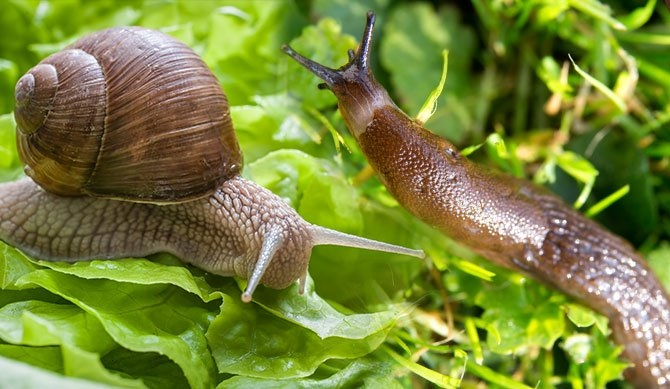
</div>

<div>
<img src="attachment:image-2.png" width="500"/>
</div>


## 6. Which classes have the most threatened species?

In [19]:
Thretened_species= df[['Subtotal (threatened spp.)']]
Thretened_species = Thretened_species.sort_values(by=['Subtotal (threatened spp.)'],ascending=False)
TH1 = Thretened_species.loc[(Thretened_species!=0).any(axis=1)] #remove domains with 0 
TH1.index

Index(['MAGNOLIOPSIDA', 'LILIOPSIDA', 'ACTINOPTERYGII', 'AMPHIBIA', 'INSECTA',
       'GASTROPODA', 'REPTILIA', 'AVES', 'MAMMALIA', 'MALACOSTRACA',
       'CHONDRICHTHYES', 'ANTHOZOA', 'ARACHNIDA', 'POLYPODIOPSIDA',
       'CYCADOPSIDA', 'BIVALVIA', 'PINOPSIDA', 'AGARICOMYCETES', 'BRYOPSIDA',
       'DIPLOPODA', 'LECANOROMYCETES', 'JUNGERMANNIOPSIDA', 'MAXILLOPODA',
       'BRANCHIOPODA', 'LYCOPODIOPSIDA', 'CLITELLATA', 'HEXANAUPLIA',
       'HOLOTHUROIDEA', 'SPHAGNOPSIDA', 'OSTRACODA', 'HYDROZOA', 'CHILOPODA',
       'FLORIDEOPHYCEAE', 'MYXINI', 'UDEONYCHOPHORA', 'CEPHALASPIDOMORPHI',
       'MARCHANTIOPSIDA', 'PHAEOPHYCEAE', 'CEPHALOPODA', 'GNETOPSIDA',
       'PEZIZOMYCETES', 'COLLEMBOLA', 'ARTHONIOMYCETES', 'ENOPLA',
       'SARCOPTERYGII', 'SORDARIOMYCETES', 'USTILAGINOMYCETES', 'MEROSTOMATA',
       'ANTHOCEROTOPSIDA', 'ANDREAEOPSIDA', 'LEOTIOMYCETES',
       'GEOGLOSSOMYCETES', 'EUROTIOMYCETES', 'DOTHIDEOMYCETES',
       'POLYPLACOPHORA', 'POLYCHAETA', 'SOLENOGASTRES', 'GINKGOOP

In [20]:
TH1 =TH1.iloc[0:10] #top 10 
TH1

,Subtotal (threatened spp.)
Name,
MAGNOLIOPSIDA,20551.0
LILIOPSIDA,3449.0
ACTINOPTERYGII,3134.0
AMPHIBIA,2606.0
INSECTA,2345.0
GASTROPODA,2178.0
REPTILIA,1842.0
AVES,1400.0
MAMMALIA,1340.0


In [21]:
TH1['Organisms'] = ['Magnolia Plants', 'Monocot Plants', 'Ray-Finned Fish', 'Amphibians', 'Insects','Snails & Slugs', 'Reptils', 'Birds', 'Mammals', 'Soft-Shells']
TH1['Organisms']

Name
MAGNOLIOPSIDA     Magnolia Plants
LILIOPSIDA         Monocot Plants
ACTINOPTERYGII    Ray-Finned Fish
AMPHIBIA               Amphibians
INSECTA                   Insects
GASTROPODA         Snails & Slugs
REPTILIA                  Reptils
AVES                        Birds
MAMMALIA                  Mammals
MALACOSTRACA          Soft-Shells
Name: Organisms, dtype: object

In [22]:
TH1['Kingdom'] = ['Plant', 'Plant', 'Animal', 'Animal', 'Animal', 'Animal', 'Animal', 'Animal','Animal', 'Animal']

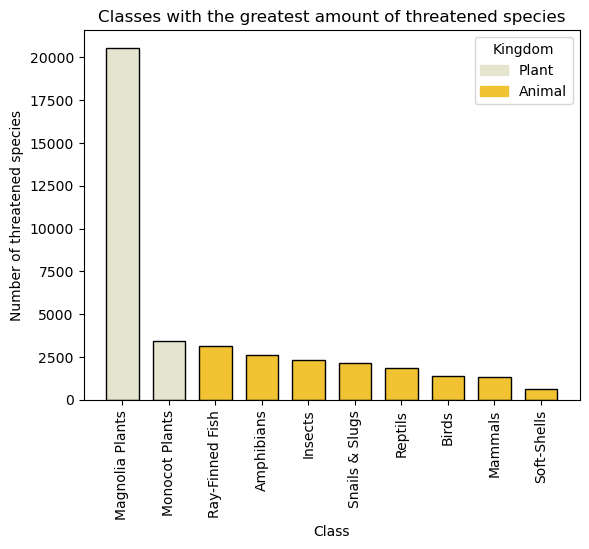

In [209]:
col = []
for val in TH1['Kingdom']:
    if val == 'Animal':
        col.append('#f1c232')
    else:
        col.append('#e5e4ce')

plt.bar(TH1['Organisms'], TH1['Subtotal (threatened spp.)'], width=0.7, color = col, edgecolor = 'black') # create a simple bar chart#color = col_map.colors

plt.title('Classes with the greatest amount of threatened species', size = 12) # add title and labels
# rotate x-axis labels
plt.ylabel("Number of threatened species")
plt.xlabel("Class")
plt.xticks(rotation=90)

# Create custom legend
green_patch = mpatches.Patch(color='#e5e4ce', label='Plant')
orange_patch = mpatches.Patch(color='#f1c232', label='Animal')
plt.legend(handles=[green_patch, orange_patch], title='Kingdom')

plt.show()

## 7.  Is there a correlation between amount of extinct and threatened species in a class and the amount of assessed species?

Text(0.5, 1.0, 'Correlation of total assessed species pr. class and amount of extinct species (EX+EW)')

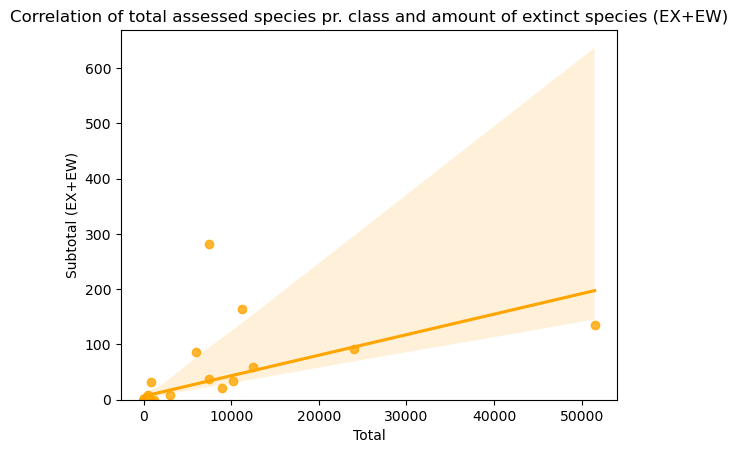

In [255]:
#correlation total assessed vs extinct taxa
sns.regplot(x='Total', y = 'Subtotal (EX+EW)', data = df, color = 'orange')
plt.ylim(0,)
plt.title('Correlation of total assessed species pr. class and amount of extinct species (EX+EW)')

In [74]:
corr_data = df[['Total','Subtotal (EX+EW)']]
correlation = corr_data.corr(method='pearson')
correlation

,Total,Subtotal (EX+EW)
Total,1.000000,0.602061
Subtotal (EX+EW),0.602061,1.000000


In [75]:
#find p-value and corr. 

from scipy.stats import pearsonr

pearsonr(df['Total'], df['Subtotal (EX+EW)'])

PearsonRResult(statistic=0.6020609760879557, pvalue=5.6057386966682804e-08)

## 8. Is there a correlation between amount of number of species extinct and extinct in the wild?

Text(0.5, 1.0, 'Classes: Correlation between number of extinct and extinct in the wilds species')

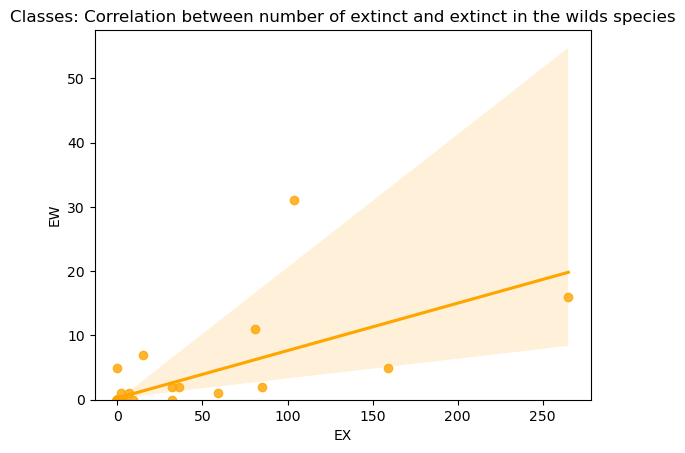

In [254]:
sns.regplot(x='EX', y = 'EW', data = df, color = 'orange')
plt.ylim(0,)
plt.title('Classes: Correlation between number of extinct and extinct in the wilds species')

In [279]:
corr_data = df[['EX','EW']]
correlation = corr_data.corr(method='pearson')
correlation

,EX,EW
EX,1.000000,0.682735
EW,0.682735,1.000000


## 9. Is there a clear correlation between number of Ectinct species (EX+EW) and the amount of assessed species pr class?

Text(0.5, 1.0, 'Correlation of total assessed species pr. class and amount of extinct species (EX+EW)')

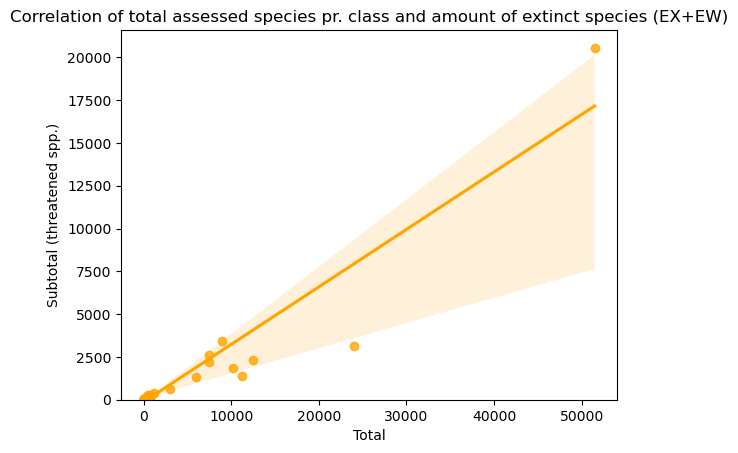

In [256]:
#correlation total assessed vs extinct taxa
sns.regplot(x='Total', y = 'Subtotal (threatened spp.)', data = df, color = 'orange')
plt.ylim(0,)
plt.title('Correlation of total assessed species pr. class and amount of extinct species (EX+EW)')

### 10. What is the 10 classes with the biggest percentage of threatened species (only including classes with more than 500 assessed species)

In [105]:
Total_Threatened_perc = 100/(df['Total'] / df['Subtotal (threatened spp.)']) 
df['Total_Threatened_perc']= pd.DataFrame(Total_Threatened_perc)

In [292]:
df_perc = df[['Total_Threatened_perc', 'Total']]
# Filter rows where 'Total' is more than 20 and select specific columns
df_perc = df.loc[df['Total'] > 100, ['Total_Threatened_perc', 'Total']]


In [293]:

# Sort df_perc by 'Total_Threatened_perc' in descending order
df_perc_sorted = df_perc.sort_values(by='Total_Threatened_perc').tail(10)

Text(0, 0.5, 'Class')

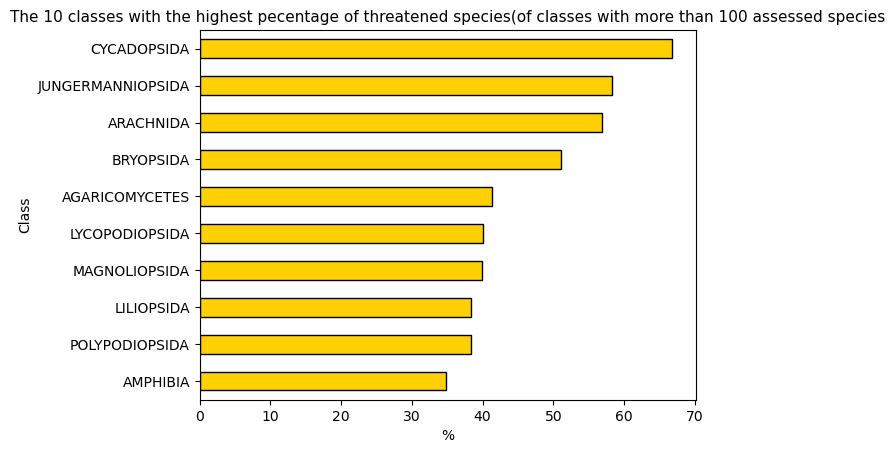

In [295]:
ax = df_perc_sorted['Total_Threatened_perc'].plot.barh(stacked=False, color = '#ffd003', edgecolor = 'black', legend = False) 
ax.set_ylabel("Class") 
ax.set_xlabel("Number of species")

# Add overall title
plt.title('The 10 classes with the highest pecentage of threatened species(of classes with more than 100 assessed species', fontsize=11)

# Add axis titles
plt.xlabel('%')
plt.ylabel('Class')


In [ ]:
# What is the correlation between number of threatened species and percentage of threatened species?

In [270]:
df.shape

(68, 18)

In [297]:
# Filter rows where 'Total' is more than 20 and select specific columns
df_new = df.loc[df['Total'] > 50]
df_new.shape

(30, 18)

Text(0.5, 1.0, 'Correlation between number of threatened species pr. class and percentage of threatened species pr class')

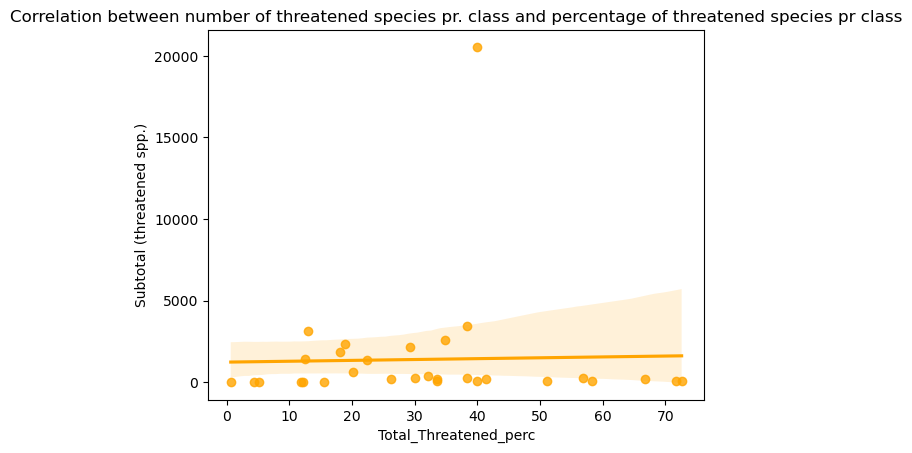

In [298]:
#correlation total assessed vs extinct taxa
sns.regplot(x='Total_Threatened_perc', y = 'Subtotal (threatened spp.)', data = df_new, color = 'orange')
plt.title('Correlation between number of threatened species pr. class and percentage of threatened species pr class')

In [299]:
corr_data = df_new[['Total_Threatened_perc','Subtotal (threatened spp.)']]
correlation = corr_data.corr(method='pearson')
correlation

,Total_Threatened_perc,Subtotal (threatened spp.)
Total_Threatened_perc,1.000000,0.027887
Subtotal (threatened spp.),0.027887,1.000000
